In [ ]:
# 라이브러리 가져오기

In [ ]:
# 데이터 로드 (GCS)
from google.colab import files
uploaded = files.upload()

Saving service_key.json to service_key (1).json


In [ ]:
# 환경변수 지정
import os
service_account_json = list(uploaded.keys())[0]
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = service_account_json

# gcloud 인증 (gsutil도 이 인증을 사용)
!gcloud auth activate-service-account --key-file="$GOOGLE_APPLICATION_CREDENTIALS"

Activated service account credentials for: [48673003346-compute@developer.gserviceaccount.com]


<h1><br>데이터 통계<br><h1>

In [ ]:
from google.cloud import storage

# 클라이언트 생성 (인증은 이미 완료되었다고 가정)
client = storage.Client()

# 경로 리스트
prefixes = [
    "Training/01.원천데이터/TS_task1_yolo_dispose_BLOUSE_unzipped/TS_task1_yolo_dispose_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_dispose_SHIRTS_unzipped/TS_task1_yolo_dispose_SHIRTS_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_recycle_BLOUSE_unzipped/TS_task1_yolo_recycle_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_recycle_SHIRTS_unzipped/TS_task1_yolo_recycle_SHIRTS_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_reusable_SHIRTS_unzipped/TS_task1_yolo_reusable_SHIRTS_unzipped"
]

bucket_name = "deeplearn-bucket-1"

# 결과 저장
results = []

for prefix in prefixes:
    jpg_count = 0
    png_count = 0

    blobs = client.list_blobs(bucket_name, prefix=prefix)

    for blob in blobs:
        if blob.name.endswith(".jpg"):
            jpg_count += 1
        elif blob.name.endswith(".png"):
            png_count += 1

    total = jpg_count + png_count
    results.append({
        "prefix": prefix,
        "total": total,
        "jpg": jpg_count,
        "png": png_count
    })

# 결과 출력
for i, res in enumerate(results, 1):
    print(f"[{i}] {res['prefix']}")
    print(f"   총 이미지 개수: {res['total']} (jpg: {res['jpg']}, png: {res['png']})\n")




[1] Training/01.원천데이터/TS_task1_yolo_dispose_BLOUSE_unzipped/TS_task1_yolo_dispose_BLOUSE_unzipped
   총 이미지 개수: 438 (jpg: 438, png: 0)

[2] Training/01.원천데이터/TS_task1_yolo_dispose_SHIRTS_unzipped/TS_task1_yolo_dispose_SHIRTS_unzipped
   총 이미지 개수: 520 (jpg: 520, png: 0)

[3] Training/01.원천데이터/TS_task1_yolo_recycle_BLOUSE_unzipped/TS_task1_yolo_recycle_BLOUSE_unzipped
   총 이미지 개수: 1184 (jpg: 1184, png: 0)

[4] Training/01.원천데이터/TS_task1_yolo_recycle_SHIRTS_unzipped/TS_task1_yolo_recycle_SHIRTS_unzipped
   총 이미지 개수: 1198 (jpg: 1198, png: 0)

[5] Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped
   총 이미지 개수: 2074 (jpg: 2074, png: 0)

[6] Training/01.원천데이터/TS_task1_yolo_reusable_SHIRTS_unzipped/TS_task1_yolo_reusable_SHIRTS_unzipped
   총 이미지 개수: 4142 (jpg: 4142, png: 0)



<h2><br>JSON 파일 전처리 후 저장<br></h2>

In [ ]:
import os
import json
from glob import glob

# --------- 사용자 설정 ---------
bucket = "deeplearn-bucket-1"
prefixes = [
    "Training/02.라벨링데이터/TL_task1_yolo_dispose_BLOUSE_unzipped/TL_task1_yolo_dispose_BLOUSE_unzipped",
    "Training/02.라벨링데이터/TL_task1_yolo_dispose_SHIRTS_unzipped/TL_task1_yolo_dispose_SHIRTS_unzipped",
    "Training/02.라벨링데이터/TL_task1_yolo_recycle_BLOUSE_unzipped/TL_task1_yolo_recycle_BLOUSE_unzipped",
    "Training/02.라벨링데이터/TL_task1_yolo_recycle_SHIRTS_unzipped/TL_task1_yolo_recycle_SHIRTS_unzipped",
    "Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped",
    "Training/02.라벨링데이터/TL_task1_yolo_reusable_SHIRTS_unzipped/TL_task1_yolo_reusable_SHIRTS_unzipped"
]

gcs_output_dir = f"gs://{bucket}/BLIP/jsonl/"
local_base = "/content/label_json"
os.makedirs(local_base, exist_ok=True)

# --------- 전처리 및 저장 루프 ---------
for prefix in prefixes:
    dir_name = prefix.split("/")[-1]
    local_dir = os.path.join(local_base, dir_name)
    os.makedirs(local_dir, exist_ok=True)

    # 1. GCS → Colab 다운로드
    gcs_full_path = f"gs://{bucket}/{prefix}/*.json"
    print(f"🔽 Downloading from {gcs_full_path} ...")
    !gsutil -m cp $gcs_full_path $local_dir/

    # 2. JSON → JSONL로 변환
    jsonl_lines = []
    json_files = sorted(glob(os.path.join(local_dir, "*.json")))
    for path in json_files:
        try:
            with open(path, "r", encoding="utf-8") as f:
                data = json.load(f)
            file_name = data.get("meta_information", {}).get("file_name")
            caption = data.get("image_caption", {}).get("caption")
            if file_name and caption:
                jsonl_lines.append(json.dumps({"image": file_name, "caption": caption}, ensure_ascii=False))
        except Exception as e:
            print(f"⚠️ {os.path.basename(path)} 처리 실패: {e}")

    # 3. 로컬에 jsonl 저장
    jsonl_filename = f"{dir_name}.jsonl"
    jsonl_path = os.path.join(local_base, jsonl_filename)
    with open(jsonl_path, "w", encoding="utf-8") as f:
        f.write("\n".join(jsonl_lines))
    print(f"✅ {jsonl_filename} 저장 완료 ({len(jsonl_lines)}개 항목)")

    # 4. GCS에 업로드
    gcs_target_path = os.path.join(gcs_output_dir, jsonl_filename)
    !gsutil cp $jsonl_path $gcs_target_path
    print(f"☁️ 업로드 완료 → {gcs_target_path}\n")


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01938.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01939.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01936.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01942.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01944.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusable_BLOUSE_unzipped/TL_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01945.json...
Copying gs://deeplearn-bucket-1/Training/02.라벨링데이터/TL_task1_yolo_reusa

<h2><br>BLIP 모델 Fine-tuning<br></h2>

1. 필요한 환경 설정

In [ ]:
# transformer 설치
!pip install transformers accelerate torchvision --quiet
!pip install datasets --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 128.9 MB/s eta 0:00:00


In [ ]:
# 라이브러리 로드
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import os
import torch
from IPython.display import display
from datasets import load_dataset, Dataset
from transformers import Trainer, TrainingArguments
from torchvision import transforms

2. GCS에서 이미지 + .jsonl 다운로드

In [ ]:
# 이미지 전체 다운로드
image_prefixes = [
    "Training/01.원천데이터/TS_task1_yolo_dispose_BLOUSE_unzipped/TS_task1_yolo_dispose_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_dispose_SHIRTS_unzipped/TS_task1_yolo_dispose_SHIRTS_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_recycle_BLOUSE_unzipped/TS_task1_yolo_recycle_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_recycle_SHIRTS_unzipped/TS_task1_yolo_recycle_SHIRTS_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped",
    "Training/01.원천데이터/TS_task1_yolo_reusable_SHIRTS_unzipped/TS_task1_yolo_reusable_SHIRTS_unzipped"
]
bucket = "deeplearn-bucket-1"
image_dir = "/content/blip_images"
os.makedirs(image_dir, exist_ok=True)

# 다운로드
for prefix in image_prefixes:
    gcs_path = f"gs://{bucket}/{prefix}/*"
    !gsutil -m cp $gcs_path $image_dir/


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01908.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01911.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01912.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01915.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01921.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_unzipped/TS_task1_yolo_reusable_BLOUSE_unzipped/RU_BL_01920.jpg...
Copying gs://deeplearn-bucket-1/Training/01.원천데이터/TS_task1_yolo_reusable_BLOUSE_un

In [ ]:
# .jsonl 6개 다운로드
jsonl_dir = "/content/blip_jsonl"
os.makedirs(jsonl_dir, exist_ok=True)

jsonl_names = [
    "TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_dispose_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_recycle_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_recycle_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_reusable_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_reusable_SHIRTS_unzipped.jsonl",
]

for name in jsonl_names:
    gcs_path = f"gs://{bucket}/BLIP/jsonl/{name}"
    !gsutil cp $gcs_path $jsonl_dir/


Copying gs://deeplearn-bucket-1/BLIP/jsonl/TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl...
/ [1 files][ 77.5 KiB/ 77.5 KiB]                                                
Operation completed over 1 objects/77.5 KiB.                                     
Copying gs://deeplearn-bucket-1/BLIP/jsonl/TL_task1_yolo_dispose_SHIRTS_unzipped.jsonl...
/ [1 files][ 98.7 KiB/ 98.7 KiB]                                                
Operation completed over 1 objects/98.7 KiB.                                     
Copying gs://deeplearn-bucket-1/BLIP/jsonl/TL_task1_yolo_recycle_BLOUSE_unzipped.jsonl...
/ [1 files][209.8 KiB/209.8 KiB]                                                
Operation completed over 1 objects/209.8 KiB.                                    
Copying gs://deeplearn-bucket-1/BLIP/jsonl/TL_task1_yolo_recycle_SHIRTS_unzipped.jsonl...
/ [1 files][234.2 KiB/234.2 KiB]                                                
Operation completed over 1 objects/234.2 KiB.                         

3. .jsonl 불러오기 + 이미지 전처리 정의

In [ ]:
jsonl_names = [
    "TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_dispose_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_recycle_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_recycle_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_reusable_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_reusable_SHIRTS_unzipped.jsonl"
]

In [ ]:
import shutil
import os

# 현재 JSONL 파일이 있는 디렉토리
jsonl_dir = "/content/blip_jsonl"

# 이동할 디렉토리
tmp_dir = "/tmp"

# 파일명 리스트
jsonl_names = [
    "TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_dispose_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_recycle_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_recycle_SHIRTS_unzipped.jsonl",
    "TL_task1_yolo_reusable_BLOUSE_unzipped.jsonl",
    "TL_task1_yolo_reusable_SHIRTS_unzipped.jsonl"
]

# 복사 수행
for name in jsonl_names:
    src_path = os.path.join(jsonl_dir, name)
    dst_path = os.path.join(tmp_dir, name)
    shutil.copy(src_path, dst_path)
    print(f"{name} → /tmp/ 로 복사 완료")

TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl → /tmp/ 로 복사 완료
TL_task1_yolo_dispose_SHIRTS_unzipped.jsonl → /tmp/ 로 복사 완료
TL_task1_yolo_recycle_BLOUSE_unzipped.jsonl → /tmp/ 로 복사 완료
TL_task1_yolo_recycle_SHIRTS_unzipped.jsonl → /tmp/ 로 복사 완료
TL_task1_yolo_reusable_BLOUSE_unzipped.jsonl → /tmp/ 로 복사 완료
TL_task1_yolo_reusable_SHIRTS_unzipped.jsonl → /tmp/ 로 복사 완료


In [ ]:
from transformers import BlipProcessor
from datasets import concatenate_datasets
from datasets import Dataset
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForConditionalGeneration
import json


# BLIP processor와 모델 로드
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [ ]:
from transformers import BlipProcessor
from datasets import concatenate_datasets
from datasets import Dataset
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForConditionalGeneration
import json


# BLIP processor와 모델 로드
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

# 새로운 디렉토리 경로
jsonl_dir = "/tmp"
image_dir = "/content/blip_images"

# 데이터 로딩
dataset_list = []
for name in jsonl_names:
    path = os.path.join(jsonl_dir, name)

    with open(path, "r", encoding="utf-8") as f:
        lines = [json.loads(l) for l in f if l.strip()]

    ds = Dataset.from_list(lines)
    dataset_list.append(ds)

dataset = concatenate_datasets(dataset_list)
print(f"전체 샘플 수: {len(dataset)}")


# 전처리 함수 정의
def transform(example):
    image_path = os.path.join(image_dir, example["image"])
    try:
        image = Image.open(image_path).convert("RGB")
    except:
        image = Image.new("RGB", (224, 224))
    inputs = processor(images=image, text=example["caption"], return_tensors="pt", padding="max_length", truncation=True, max_length=128)
    return {
        "input_ids": inputs.input_ids[0],
        "attention_mask": inputs.attention_mask[0],
        "pixel_values": inputs.pixel_values[0],
        "labels": inputs.input_ids[0]
    }

# 전처리 적용
dataset = dataset.map(transform, remove_columns=["image", "caption"])

dataset.save_to_disk("/content/preprocessed_blip_dataset")
print("💾 전처리된 데이터셋 저장 완료")


전체 샘플 수: 9556


/usr/local/lib/python3.11/dist-packages/datasets/table.py:1395: FutureWarning: promote has been superseded by promote_options='default'.
  block_group = [InMemoryTable(cls._concat_blocks(list(block_group), axis=axis))]
/usr/local/lib/python3.11/dist-packages/datasets/table.py:1421: FutureWarning: promote has been superseded by promote_options='default'.
  table = cls._concat_blocks(blocks, axis=0)


Map:   0%|          | 0/9556 [00:00<?, ? examples/s]

Saving the dataset (0/34 shards):   0%|          | 0/9556 [00:00<?, ? examples/s]

💾 전처리된 데이터셋 저장 완료


In [ ]:
# 2. GCS 경로 설정
bucket_name = "deeplearn-bucket-1"
gcs_path = f"gs://{bucket_name}/BLIP/preprocessed_blip_dataset"

# 3. 업로드 실행
!gsutil -m cp -r /content/preprocessed_blip_dataset {gcs_path}

Copying file:///content/preprocessed_blip_dataset/data-00003-of-00034.arrow [Content-Type=application/vnd.apache.arrow.file]...
Copying file:///content/preprocessed_blip_dataset/data-00022-of-00034.arrow [Content-Type=application/vnd.apache.arrow.file]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

Copying file:///content/preprocessed_blip_dataset/data-00024-of-0003

4. 데이터셋 분할

In [ ]:
# train/test 나누기
from datasets import load_from_disk

dataset = load_from_disk("/content/preprocessed_blip_dataset")

dataset_split = dataset.train_test_split(test_size=0.1, seed=42)
train_dataset = dataset_split["train"]
eval_dataset = dataset_split["test"]

/usr/local/lib/python3.11/dist-packages/datasets/table.py:1421: FutureWarning: promote has been superseded by promote_options='default'.
  table = cls._concat_blocks(blocks, axis=0)


5. Trainer로 Fine-tuning

In [ ]:
training_args = TrainingArguments(
    output_dir="./blip_finetuned",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_dir="./logs",
    logging_steps=10,
    learning_rate=5e-5,
    remove_unused_columns=False,
    fp16=True,
    report_to="none",
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss"
)

# 7. Trainer 정의
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset
)

# 8. 학습 시작
trainer.train()

Epoch,Training Loss,Validation Loss
1,0.224300,0.207488
2,0.138100,0.167237
3,0.112300,0.150097


There were missing keys in the checkpoint model loaded: ['text_decoder.cls.predictions.decoder.bias'].


TrainOutput(global_step=3225, training_loss=0.2910142052820487, metrics={'train_runtime': 8227.4814, 'train_samples_per_second': 3.136, 'train_steps_per_second': 0.392, 'total_flos': 1.531033022740562e+19, 'train_loss': 0.2910142052820487, 'epoch': 3.0})

6. 학습된 모델 저장 및 예측 테스트

In [ ]:
model.save_pretrained("./blip_finetuned/final_model")
processor.save_pretrained("./blip_finetuned/final_model")

[]

In [ ]:
# 학습된 모델 gcs 업로드
import subprocess

local_path = "/content/blip_finetuned"
gcs_path = "gs://deeplearn-bucket-1/BLIP/blip_finetuned"

# -m: 병렬 업로드, -r: 재귀적으로 디렉토리 포함
subprocess.run(["gsutil", "-m", "cp", "-r", local_path, gcs_path], check=True)

print("업로드 완료 → gs://deeplearn-bucket-1/BLIP/blip_finetuned/")

업로드 완료 → gs://deeplearn-bucket-1/BLIP/blip_finetuned/


In [ ]:
# test 데이터셋 확인
print(eval_dataset[0])

{'input_ids': [101, 1469, 30018, 30021, 29997, 30007, 30020, 1461, 30017, 30003, 30017, 29994, 30006, 29999, 30019, 30004, 30017, 1468, 30007, 30003, 30008, 30021, 29999, 30019, 29995, 30010, 1466, 30006, 29994, 30006, 29991, 30006, 100, 1464, 30014, 30025, 29999, 30006, 30025, 29999, 30009, 1469, 30018, 30021, 29997, 30007, 30020, 1457, 30006, 30021, 30001, 30014, 29999, 30012, 1463, 30014, 30001, 30017, 30020, 1461, 30006, 30025, 29993, 30006, 30021, 29999, 30009, 1468, 30007, 30001, 30019, 100, 100, 1469, 30006, 29992, 30017, 30022, 29997, 30007, 30020, 29999, 30018, 1456, 30006, 30023, 29992, 30010, 1455, 30011, 30025, 29999, 30013, 30025, 1455, 30019, 30021, 30004, 30006, 30022, 1461, 30010, 30001, 30017, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [ ]:
# test 데이터셋 중 하나 예측해보기

jsonl_path = "/content/blip_jsonl/TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl"
target_image = "DP_BL_00137.jpg"
real_caption = None

with open(jsonl_path, "r", encoding="utf-8") as f:
    for line in f:
        data = json.loads(line)
        if data["image"] == target_image:
            real_caption = data["caption"]
            break

if real_caption is None:
    raise ValueError(f"{target_image}에 대한 캡션을 찾을 수 없습니다.")

# 이미지 로딩 및 캡션 생성
image_path = f"/content/blip_images/{target_image}"
image = Image.open(image_path).convert("RGB")

# Processor로 입력 변환
inputs = processor(images=image, return_tensors="pt").to(model.device)

# 캡션 생성
with torch.no_grad():
    generated_ids = model.generate(**inputs, max_length=128)
    predicted_caption = processor.decode(generated_ids[0], skip_special_tokens=True)

print("이미지 경로:", image_path)
print("예측된 캡션:", predicted_caption)
print("실제 캡션:", real_caption)

이미지 경로: /content/blip_images/DP_BL_00137.jpg
예측된 캡션: 중앙에 흰색의 남녀 공용 긴팔 셔츠
실제 캡션: 브이넥으로 주머니와 고리 장식이 있으며 좌측 상단과 중앙에 외부오염이 있는 아이보리색 여성용 긴팔 블라우스


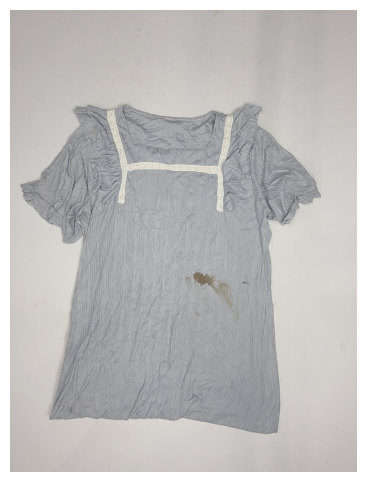

예측된 캡션: 흰색과 스트라이프 패턴이 중앙에 여성용 반팔 블라우스
실제 캡션: 우측 중앙에 외부오염이 있는 하늘색 여성용 반팔 드레스


In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import torch
import matplotlib.pyplot as plt
import json

# 파일 경로 설정
jsonl_path = "/content/blip_jsonl/TL_task1_yolo_dispose_BLOUSE_unzipped.jsonl"
target_image = "DP_BL_00123.jpg"
real_caption = None

# 실제 캡션 가져오기
with open(jsonl_path, "r", encoding="utf-8") as f:
    for line in f:
        data = json.loads(line)
        if data["image"] == target_image:
            real_caption = data["caption"]
            break

if real_caption is None:
    raise ValueError(f"{target_image}에 대한 캡션을 찾을 수 없습니다.")

# 이미지 로딩 및 모델 입력
image_path = f"/content/blip_images/{target_image}"
image = Image.open(image_path).convert("RGB")
inputs = processor(images=image, return_tensors="pt").to(model.device)

# 캡션 생성
with torch.no_grad():
    generated_ids = model.generate(**inputs, max_length=128)
    predicted_caption = processor.decode(generated_ids[0], skip_special_tokens=True)

# 이미지 먼저 출력
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")
plt.show()

# 예측 및 실제 캡션 출력
print("예측된 캡션:", predicted_caption)
print("실제 캡션:", real_caption)



7. 예측 성능 평가

In [ ]:
!pip install evaluate nltk --quiet
!pip install rouge_score --quiet

import evaluate
import nltk
nltk.download('punkt')

  Preparing metadata (setup.py) ... done


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
bleu = evaluate.load("bleu")
rouge = evaluate.load("rouge")
meteor = evaluate.load("meteor")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
# test 데이터에 대한 정답 캡션 생성
import torch
from tqdm import tqdm

references = []
predictions = []

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
model.eval()

for sample in tqdm(eval_dataset):
    pixel_values = torch.tensor(sample["pixel_values"]).unsqueeze(0).to(device)
    with torch.no_grad():
        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=50)
    generated_caption = processor.decode(generated_ids[0], skip_special_tokens=True)
    predictions.append(generated_caption)

    # 정답 캡션 (input_ids → 텍스트 복원)
    label_ids = sample["labels"]
    label_text = processor.tokenizer.decode(label_ids, skip_special_tokens=True)
    references.append(label_text)



100%|██████████| 956/956 [18:51<00:00,  1.18s/it]


In [ ]:
# BLEU expects list of references per prediction
bleu_result = bleu.compute(predictions=predictions, references=[[ref] for ref in references])
rouge_result = rouge.compute(predictions=predictions, references=references)
meteor_result = meteor.compute(predictions=predictions, references=references)

print("Evaluation Metrics on Validation Set")
print(f"BLEU score:  {bleu_result['bleu']:.4f}")
print(f"ROUGE-L:     {rouge_result['rougeL']:.4f}")
print(f"METEOR:      {meteor_result['meteor']:.4f}")


Evaluation Metrics on Validation Set
BLEU score:  0.1174
ROUGE-L:     0.0105
METEOR:      0.2810


<h1><br>Fine-tuning Retry</br></h1>

In [ ]:
training_args = TrainingArguments(
    output_dir="./blip_finetuned_v2",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=5,  # 증가
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_dir="./logs",
    logging_steps=10,
    learning_rate=3e-5,  # 감소
    gradient_accumulation_steps=2,  # 추가
    remove_unused_columns=False,
    fp16=True,
    report_to="none",
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss"
)

# Trainer 정의
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset
)

# 학습 시작
trainer.train()

Epoch,Training Loss,Validation Loss
1,0.126500,0.157299
2,0.099500,0.157422
3,0.072100,0.160317
4,0.050100,0.168785
5,0.037200,0.175350


There were missing keys in the checkpoint model loaded: ['text_decoder.cls.predictions.decoder.bias'].


TrainOutput(global_step=2690, training_loss=0.07884542105587884, metrics={'train_runtime': 13533.304, 'train_samples_per_second': 3.177, 'train_steps_per_second': 0.199, 'total_flos': 2.551721704567603e+19, 'train_loss': 0.07884542105587884, 'epoch': 5.0})

In [ ]:
model.save_pretrained("./blip_finetuned_v2/final_model")
processor.save_pretrained("./blip_finetuned_v2/final_model")

[]

In [ ]:
# 학습된 모델 gcs 업로드
import subprocess

local_path = "/content/blip_finetuned_v2"
gcs_path = "gs://deeplearn-bucket-1/BLIP/blip_finetuned_v2"

# -m: 병렬 업로드, -r: 재귀적으로 디렉토리 포함
subprocess.run(["gsutil", "-m", "cp", "-r", local_path, gcs_path], check=True)

print("업로드 완료 → gs://deeplearn-bucket-1/BLIP/blip_finetuned_v2/")

업로드 완료 → gs://deeplearn-bucket-1/BLIP/blip_finetuned_v2/


In [ ]:
# test 데이터에 대한 정답 캡션 생성
import torch
from tqdm import tqdm

references = []
predictions = []

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
model.eval()

for sample in tqdm(eval_dataset):
    pixel_values = torch.tensor(sample["pixel_values"]).unsqueeze(0).to(device)
    with torch.no_grad():
        generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=50)
    generated_caption = processor.decode(generated_ids[0], skip_special_tokens=True)
    predictions.append(generated_caption)

    # 정답 캡션 (input_ids → 텍스트 복원)
    label_ids = sample["labels"]
    label_text = processor.tokenizer.decode(label_ids, skip_special_tokens=True)
    references.append(label_text)

100%|██████████| 956/956 [19:06<00:00,  1.20s/it]


In [ ]:
# BLEU expects list of references per prediction
bleu_result = bleu.compute(predictions=predictions, references=[[ref] for ref in references])
rouge_result = rouge.compute(predictions=predictions, references=references)
meteor_result = meteor.compute(predictions=predictions, references=references)

print("Evaluation Metrics on Validation Set")
print(f"BLEU score:  {bleu_result['bleu']:.4f}")
print(f"ROUGE-L:     {rouge_result['rougeL']:.4f}")
print(f"METEOR:      {meteor_result['meteor']:.4f}")

Evaluation Metrics on Validation Set
BLEU score:  0.1133
ROUGE-L:     0.0188
METEOR:      0.2779


In [ ]:
# 나중에 모델 로드
from transformers import BlipProcessor, BlipForConditionalGeneration

model = BlipForConditionalGeneration.from_pretrained("./blip_finetuned/final_model")
processor = BlipProcessor.from_pretrained("./blip_finetuned/final_model")